# Task-routed init-scale geometry and transfer

This notebook compares **task-routed** two-module RNNs (25 units per module, `nb_steps=2`) across **initialization scale** and **communication sparsity**.

**Factors:**
- `input_routing = "task_routed"` (fixed)
- `dim_hidden = 25`, `nb_steps = 2`, `common_readout = True`, `common_input = False` (fixed)
- `sparsity` ∈ {no_comms, 0.1, 0.3, 0.5, 0.7, 0.9, 1.0}
- `init_scale` ∈ {1.0 (default), 0.5, 0.1, 0.01}

**Outcomes:**
- **Transfer interference**: error difference (initial B − final A1) per similarity condition (same/near/far)
- **Accuracy & loss**: per phase (post_A, post_B, post_A2)
- **PCA geometry**: dimensionality (n PCs for 95%/99% variance) and 2D PC1–PC2 for combined/core/comms pathways

In [ ]:
# 1. Setup and configuration

import sys
import os
import json
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
# Similarity and plotting order settings (fixed across all figures)
SIMILARITY_ORDER = ['same', 'near', 'far']
SIMILARITY_PALETTE = {'same': 'green', 'near': 'orange', 'far': 'blue'}
INIT_SCALE_ORDER = [0.01, 0.1, 0.3, 0.5, 0.7, 0.9, 1.0]
SPARSITY_ORDER = ['no_comms', '0.1', '0.3', '0.5', '0.7', '0.9', '1.0', 'single_module']
# Similarity colour scheme (fixed across all figures)
SIMILARITY_ORDER = ['same', 'near', 'far']
SIMILARITY_PALETTE = {'same': 'green', 'near': 'orange', 'far': 'blue'}


project_root = Path(os.getcwd()).resolve()
while not (project_root / "a1b2").exists():
    if project_root == project_root.parent:
        raise RuntimeError("Project root (containing a1b2) not found.")
    project_root = project_root.parent
sys.path.insert(0, str(project_root))
os.chdir(project_root)

from a1b2.utils.run_config import build_run_id
from a1b2.analysis import transfer_interference as ann
from a1b2.analysis.transfer_interference import prepare_pca_single_task
from a1b2.utils.figure_settings import task_colours
from a1b2.utils.figure_utils import plot_split_stim, get_axis_limits

data_folder = project_root / "data"
sim_folder = data_folder / "simulations"
config_path = project_root / "a1b2" / "models" / "experiments.json"
with open(config_path, "r") as f:
    settings = json.load(f)

print("Project root:", project_root)
print("Simulations folder:", sim_folder)


In [ ]:
# 2. Select task-routed two-module runs plus single-module baseline across init_scale and sparsity

TARGET_ARCH = "two_module_rnn"
TARGET_SINGLE_ARCH = "single_module_rnn"
TARGET_DIM_HIDDEN = 25
TARGET_NB_STEPS = 2
TARGET_ROUTING = "task_routed"
TARGET_COMMON_READOUT = True
TARGET_COMMON_INPUT = False

def is_task_routed_init_scale(c):
    arch = c.get("arch")

    # Main set: two-module, routing-specific
    if arch == TARGET_ARCH:
        if c.get("dim_hidden") != TARGET_DIM_HIDDEN:
            return False
        if c.get("nb_steps", 1) != TARGET_NB_STEPS:
            return False
        if c.get("input_routing", "shared") != TARGET_ROUTING:
            return False
        if c.get("common_readout", True) is not TARGET_COMMON_READOUT:
            return False
        if c.get("common_input", False) is not TARGET_COMMON_INPUT:
            return False
        return True

    # Baseline set: single-module ablation (routing-agnostic)
    if arch == TARGET_SINGLE_ARCH:
        if c.get("dim_hidden") != TARGET_DIM_HIDDEN:
            return False
        if c.get("nb_steps", 1) != TARGET_NB_STEPS:
            return False
        return True

    return False

selected = [c for c in settings["conditions"] if is_task_routed_init_scale(c)]
rows = []
for c in selected:
    init_scale = c.get("init_scale", None)
    if init_scale is None:
        init_scale = 1.0

    run_id = build_run_id(c)
    path = sim_folder / run_id

    if c.get("arch") == TARGET_SINGLE_ARCH:
        sp_label = "single_module"
        sp_val = np.nan
    else:
        sp = c.get("sparsity", 1.0)
        if sp == 0 or "no_comms" in c.get("name", ""):
            sp_label = "no_comms"
        else:
            sp_float = float(sp)
            sp_label = "1.0" if np.isclose(sp_float, 1.0) else str(sp_float)
        sp_val = float(sp)

    rows.append({
        "name": c.get("name"),
        "run_id": run_id,
        "arch": c.get("arch"),
        "init_scale": float(init_scale),
        "sparsity": sp_val,
        "sparsity_label": sp_label,
        "path_exists": path.exists(),
        "path": str(path),
    })

taskrouted_init = pd.DataFrame(rows)
if not taskrouted_init.empty:
    taskrouted_init["sparsity_label"] = pd.Categorical(taskrouted_init["sparsity_label"], categories=SPARSITY_ORDER, ordered=True)
    taskrouted_init = taskrouted_init.sort_values(["sparsity_label", "init_scale", "name"]).reset_index(drop=True)
display(taskrouted_init)
valid = taskrouted_init[taskrouted_init["path_exists"]].copy()
print("Selected runs:", len(taskrouted_init), "| Valid runs (path exists):", len(valid))
print("Init scales in table:", [s for s in INIT_SCALE_ORDER if s in set(taskrouted_init["init_scale"].astype(float).tolist())])
print("Sparsities in table:", [s for s in SPARSITY_ORDER if s in set(taskrouted_init["sparsity_label"].astype(str).tolist())])



In [3]:
# 3. Load ANN data for valid runs (same/near/far schedules)

all_ann_data = {}
for _, row in valid.iterrows():
    run_id = row["run_id"]
    path = Path(row["path"])
    ann_data = ann.load_ann_data(str(path), load_rnn_extra=True)
    if len(ann_data.get("same", [])) > 0 and len(ann_data.get("near", [])) > 0 and len(ann_data.get("far", [])) > 0:
        all_ann_data[run_id] = {
            "data": ann_data,
            "init_scale": row["init_scale"],
            "sparsity": row["sparsity"],
            "sparsity_label": row["sparsity_label"],
        }

run_labels = list(all_ann_data.keys())
print("Loaded", len(run_labels), "task-routed runs with all three similarity conditions.")
for rid in run_labels:
    b = all_ann_data[rid]
    d = b["data"]
    print(f"  sp={b['sparsity_label']} init_scale={b['init_scale']}: same={len(d['same'])} near={len(d['near'])} far={len(d['far'])}")

Loaded 41 task-routed runs with all three similarity conditions.
  sp=no_comms init_scale=0.01: same=32 near=33 far=18
  sp=no_comms init_scale=0.1: same=103 near=101 far=101
  sp=no_comms init_scale=0.3: same=103 near=101 far=101
  sp=no_comms init_scale=0.5: same=103 near=101 far=101
  sp=no_comms init_scale=0.7: same=102 near=101 far=99
  sp=no_comms init_scale=1.0: same=103 near=101 far=101
  sp=0.1 init_scale=0.01: same=41 near=50 far=34
  sp=0.1 init_scale=0.1: same=29 near=28 far=15
  sp=0.1 init_scale=0.5: same=28 near=27 far=15
  sp=0.1 init_scale=1.0: same=103 near=101 far=101
  sp=0.3 init_scale=0.01: same=35 near=41 far=27
  sp=0.3 init_scale=0.1: same=103 near=101 far=101
  sp=0.3 init_scale=0.3: same=103 near=101 far=101
  sp=0.3 init_scale=0.5: same=103 near=101 far=101
  sp=0.3 init_scale=0.7: same=102 near=101 far=99
  sp=0.3 init_scale=1.0: same=103 near=101 far=101
  sp=0.5 init_scale=0.01: same=35 near=41 far=26
  sp=0.5 init_scale=0.1: same=103 near=101 far=101
  s

In [4]:
# 4. Compute per-participant metrics: transfer, accuracy, loss, representation

transfer_records = []
accuracy_records = []
loss_records = []
rep_records = []

for run_id in run_labels:
    bundle = all_ann_data[run_id]
    ann_data = bundle["data"]
    sparsity = bundle["sparsity"]
    sp_label = bundle["sparsity_label"]
    init_scale = bundle["init_scale"]

    for cond_name, entries in ann_data.items():
        for entry in entries:
            pid = str(entry["participant"])

            # Transfer (error_diff)
            acc = np.asarray(entry["accuracy"])
            if acc.ndim == 3:
                # 3 conditions × n_phase × n_trials; use matching condition index
                cond_idx = ["same", "near", "far"].index(cond_name) if cond_name in ["same", "near", "far"] else 0
                acc_cond = acc[cond_idx]
            else:
                acc_cond = acc
            if acc_cond.ndim >= 2 and acc_cond.shape[0] >= 2:
                A1_acc = acc_cond[0, 1::2] if acc_cond.ndim == 2 else np.asarray(acc_cond[0]).flatten()[1::2]
                B_acc = acc_cond[1, 1::2] if acc_cond.ndim == 2 else np.asarray(acc_cond[1]).flatten()[1::2]
                if len(A1_acc) >= 6 and len(B_acc) >= 6:
                    final_A1 = float(np.mean(A1_acc[-6:]))
                    init_B = float(np.mean(B_acc[:6]))
                    transfer_records.append({
                        "run_id": run_id,
                        "init_scale": init_scale,
                        "sparsity": sparsity,
                        "sparsity_label": sp_label,
                        "condition": cond_name,
                        "participant": pid,
                        "error_diff": init_B - final_A1,
                    })

            # Accuracy per phase
            if acc_cond.size > 0:
                n_ph = acc_cond.shape[0]
                for ph in range(min(3, n_ph)):
                    phase_name = ["post_A", "post_B", "post_A2"][ph]
                    mean_acc = float(np.nanmean(acc_cond[ph]))
                    accuracy_records.append({
                        "run_id": run_id,
                        "init_scale": init_scale,
                        "sparsity_label": sp_label,
                        "condition": cond_name,
                        "phase": phase_name,
                        "participant": pid,
                        "mean_accuracy": mean_acc,
                    })

            # Loss per phase
            losses = entry.get("losses")
            if losses is not None:
                loss_arr = np.asarray(losses)
                if loss_arr.ndim == 3:
                    loss_cond = loss_arr[cond_idx]
                else:
                    loss_cond = loss_arr
                n_ph = loss_cond.shape[0]
                for ph in range(min(3, n_ph)):
                    phase_name = ["post_A", "post_B", "post_A2"][ph]
                    mean_loss = float(np.nanmean(loss_cond[ph]))
                    loss_records.append({
                        "run_id": run_id,
                        "init_scale": init_scale,
                        "sparsity_label": sp_label,
                        "condition": cond_name,
                        "phase": phase_name,
                        "participant": pid,
                        "mean_loss": mean_loss,
                    })

            # Representation metrics (combined/core/comms)
            for phase_idx, phase_name in [(0, "post_A"), (1, "post_B"), (2, "post_A2")]:
                if f"hiddens_post_phase_{phase_idx}" not in entry:
                    continue
                for path in ("combined", "core", "comms"):
                    try:
                        hids = ann._get_last_step_geometry_hids(entry, phase_idx, path=path)
                    except (KeyError, ValueError):
                        continue
                    metrics = ann.compute_state_representation_metrics(
                        hids, variance_thresholds=(0.95, 0.99), top_k=2
                    )
                    row = {
                        "run_id": run_id,
                        "init_scale": init_scale,
                        "sparsity_label": sp_label,
                        "condition": cond_name,
                        "participant": pid,
                        "phase": phase_name,
                        "pathway": path,
                        "var_topk": metrics["var_topk"],
                    }
                    for thr, n in metrics["n_components"].items():
                        row[f"n_pcs_{int(thr*100)}"] = n
                    rep_records.append(row)

transfer_df = pd.DataFrame(transfer_records)
accuracy_df = pd.DataFrame(accuracy_records)
loss_df = pd.DataFrame(loss_records)
rep_df = pd.DataFrame(rep_records)

print("transfer_df:", transfer_df.shape)
print("accuracy_df:", accuracy_df.shape)
print("loss_df:", loss_df.shape)
print("rep_df:", rep_df.shape)
display(transfer_df.head(), accuracy_df.head(), rep_df.head())

transfer_df: (9560, 7)
accuracy_df: (28680, 7)
loss_df: (28680, 7)
rep_df: (73368, 10)


,run_id,init_scale,sparsity,sparsity_label,condition,participant,error_diff
0,two_module_rnn_25_task_routed_no_comms_nb2_ini...,0.01,0.0,no_comms,same,sim_study2_same_sub9,-0.380670
1,two_module_rnn_25_task_routed_no_comms_nb2_ini...,0.01,0.0,no_comms,same,sim_study2_same_sub32,-0.330740
2,two_module_rnn_25_task_routed_no_comms_nb2_ini...,0.01,0.0,no_comms,same,sim_study1_same_sub9,-0.352009
3,two_module_rnn_25_task_routed_no_comms_nb2_ini...,0.01,0.0,no_comms,same,sim_study1_same_sub40,-0.399541
4,two_module_rnn_25_task_routed_no_comms_nb2_ini...,0.01,0.0,no_comms,same,sim_study1_same_sub44,-0.402141


,run_id,init_scale,sparsity_label,condition,phase,participant,mean_accuracy
0,two_module_rnn_25_task_routed_no_comms_nb2_ini...,0.01,no_comms,same,post_A,sim_study2_same_sub9,0.836962
1,two_module_rnn_25_task_routed_no_comms_nb2_ini...,0.01,no_comms,same,post_B,sim_study2_same_sub9,0.996740
2,two_module_rnn_25_task_routed_no_comms_nb2_ini...,0.01,no_comms,same,post_A2,sim_study2_same_sub9,0.941152
3,two_module_rnn_25_task_routed_no_comms_nb2_ini...,0.01,no_comms,same,post_A,sim_study2_same_sub32,0.829651
4,two_module_rnn_25_task_routed_no_comms_nb2_ini...,0.01,no_comms,same,post_B,sim_study2_same_sub32,0.995664


,run_id,init_scale,sparsity_label,condition,participant,phase,pathway,var_topk,n_pcs_95,n_pcs_99
0,two_module_rnn_25_task_routed_no_comms_nb2_ini...,0.01,no_comms,same,sim_study2_same_sub9,post_A,combined,0.954557,2,3
1,two_module_rnn_25_task_routed_no_comms_nb2_ini...,0.01,no_comms,same,sim_study2_same_sub9,post_A,core,0.955225,2,3
2,two_module_rnn_25_task_routed_no_comms_nb2_ini...,0.01,no_comms,same,sim_study2_same_sub9,post_A,comms,0.953740,2,3
3,two_module_rnn_25_task_routed_no_comms_nb2_ini...,0.01,no_comms,same,sim_study2_same_sub9,post_B,combined,0.970875,2,3
4,two_module_rnn_25_task_routed_no_comms_nb2_ini...,0.01,no_comms,same,sim_study2_same_sub9,post_B,core,0.972453,2,3


In [5]:
# show rep_df for all init_scale = 0.1, pathway = combined and condition = same
rep_df[(rep_df["init_scale"] == 0.1) & (rep_df["pathway"] == "combined") & (rep_df["condition"] == "same")]


,run_id,init_scale,sparsity_label,condition,participant,phase,pathway,var_topk,n_pcs_95,n_pcs_99
747,two_module_rnn_25_task_routed_no_comms_nb2_ini...,0.1,no_comms,same,sim_study2_same_sub9,post_A,combined,0.954459,2,3
750,two_module_rnn_25_task_routed_no_comms_nb2_ini...,0.1,no_comms,same,sim_study2_same_sub9,post_B,combined,0.970833,2,3
753,two_module_rnn_25_task_routed_no_comms_nb2_ini...,0.1,no_comms,same,sim_study2_same_sub9,post_A2,combined,0.972679,2,3
756,two_module_rnn_25_task_routed_no_comms_nb2_ini...,0.1,no_comms,same,sim_study1_same_sub58,post_A,combined,0.931338,3,3
759,two_module_rnn_25_task_routed_no_comms_nb2_ini...,0.1,no_comms,same,sim_study1_same_sub58,post_B,combined,0.953169,2,3
...,...,...,...,...,...,...,...,...,...,...
65292,two_module_rnn_25_task_routed_nb2_init0.1_nb2_...,0.1,1.0,same,sim_study2_same_sub55,post_B,combined,0.974514,2,3
65295,two_module_rnn_25_task_routed_nb2_init0.1_nb2_...,0.1,1.0,same,sim_study2_same_sub55,post_A2,combined,0.974655,2,3
65298,two_module_rnn_25_task_routed_nb2_init0.1_nb2_...,0.1,1.0,same,sim_study2_same_sub56,post_A,combined,0.959471,2,3
65301,two_module_rnn_25_task_routed_nb2_init0.1_nb2_...,0.1,1.0,same,sim_study2_same_sub56,post_B,combined,0.974745,2,3


## 5. Transfer interference across init_scale and sparsity

,sparsity_label,init_scale,condition,error_diff
0,0.1,0.01,far,-0.373841
1,0.1,0.01,near,-0.366273
2,0.1,0.01,same,-0.364485
3,0.1,0.10,far,-0.371887
4,0.1,0.10,near,-0.369565


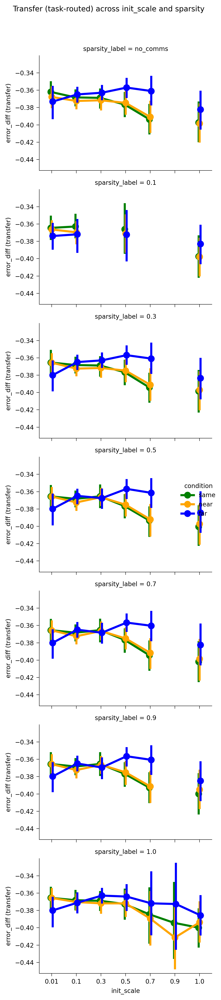

In [6]:
if not transfer_df.empty:
    transfer_summary = (
        transfer_df.groupby(["sparsity_label", "init_scale", "condition"], as_index=False)["error_diff"].mean()
    )
    display(transfer_summary.head())

    # Plot: error_diff vs init_scale, rows = sparsity, hue = condition
    init_order = INIT_SCALE_ORDER
    sp_order = SPARSITY_ORDER
    g = sns.catplot(
        data=transfer_df,
        x="init_scale",
        y="error_diff",
        hue="condition",
        palette=SIMILARITY_PALETTE,
        row="sparsity_label",
        kind="point",
        dodge=True,
        order=init_order,
        hue_order=SIMILARITY_ORDER,
        row_order=sp_order,
        height=2.5,
        aspect=1.3,
    )
    g.set_axis_labels("init_scale", "error_diff (transfer)")
    g.fig.suptitle("Transfer (task-routed) across init_scale and sparsity", y=1.02)
    plt.tight_layout()
    plt.show()
else:
    print("No transfer data.")


## 6. Accuracy and loss across init_scale

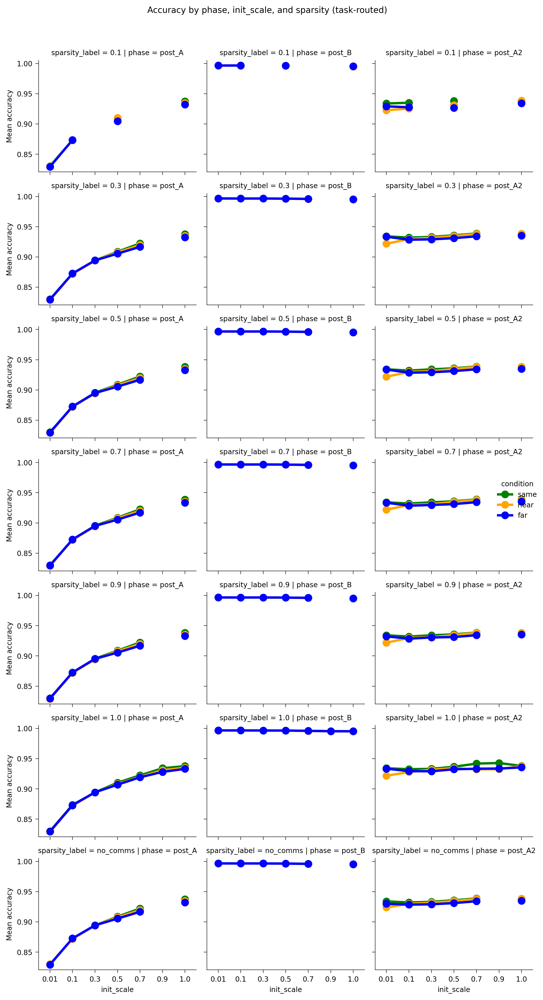

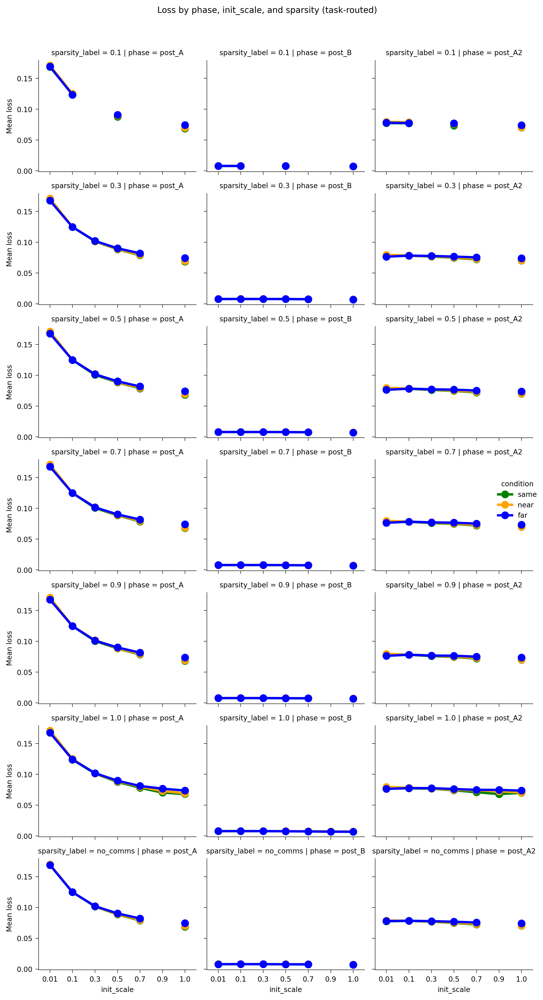

In [7]:
phase_order = ["post_A", "post_B", "post_A2"]

if not accuracy_df.empty:
    acc_agg = (
        accuracy_df.groupby(["sparsity_label", "init_scale", "condition", "phase"], as_index=False)["mean_accuracy"].mean()
    )
    g = sns.catplot(
        data=acc_agg,
        x="init_scale",
        y="mean_accuracy",
        hue="condition",
        palette=SIMILARITY_PALETTE,
        col="phase",
        row="sparsity_label",
        kind="point",
        hue_order=SIMILARITY_ORDER,
        col_order=phase_order,
        height=2.2,
        aspect=1.2,
    )
    g.set_axis_labels("init_scale", "Mean accuracy")
    g.fig.suptitle("Accuracy by phase, init_scale, and sparsity (task-routed)", y=1.02)
    plt.tight_layout()
    plt.show()
else:
    print("No accuracy data.")

if not loss_df.empty:
    loss_agg = (
        loss_df.groupby(["sparsity_label", "init_scale", "condition", "phase"], as_index=False)["mean_loss"].mean()
    )
    g = sns.catplot(
        data=loss_agg,
        x="init_scale",
        y="mean_loss",
        hue="condition",
        palette=SIMILARITY_PALETTE,
        col="phase",
        row="sparsity_label",
        kind="point",
        hue_order=SIMILARITY_ORDER,
        col_order=phase_order,
        height=2.2,
        aspect=1.2,
    )
    g.set_axis_labels("init_scale", "Mean loss")
    g.fig.suptitle("Loss by phase, init_scale, and sparsity (task-routed)", y=1.02)
    plt.tight_layout()
    plt.show()
else:
    print("No loss data.")


## 7. PCA dimensionality across init_scale (post-A2)

,run_id,sparsity_label,init_scale,condition,phase,pathway,var_topk,n_pcs_95,n_pcs_99
0,two_module_rnn_25_task_routed_low_sparse_nb2_i...,0.3,0.01,far,post_A,combined,0.951524,2.444444,3.000000
1,two_module_rnn_25_task_routed_low_sparse_nb2_i...,0.3,0.01,far,post_A,comms,0.950196,2.481481,3.000000
2,two_module_rnn_25_task_routed_low_sparse_nb2_i...,0.3,0.01,far,post_A,core,0.952590,2.370370,3.000000
3,two_module_rnn_25_task_routed_low_sparse_nb2_i...,0.3,0.01,far,post_A2,combined,0.595568,4.000000,4.000000
4,two_module_rnn_25_task_routed_low_sparse_nb2_i...,0.3,0.01,far,post_A2,comms,0.613235,4.000000,4.000000
...,...,...,...,...,...,...,...,...,...
976,two_module_rnn_25_task_routed_sp09_nb2_nb2_tas...,0.9,1.00,near,post_A2,combined,0.592273,9.039604,11.000000
977,two_module_rnn_25_task_routed_sp09_nb2_nb2_tas...,0.9,1.00,near,post_B,combined,0.607454,9.009901,11.000000
978,two_module_rnn_25_task_routed_sp09_nb2_nb2_tas...,0.9,1.00,same,post_A,combined,0.494210,9.543689,11.000000
979,two_module_rnn_25_task_routed_sp09_nb2_nb2_tas...,0.9,1.00,same,post_A2,combined,0.600737,9.009709,11.000000


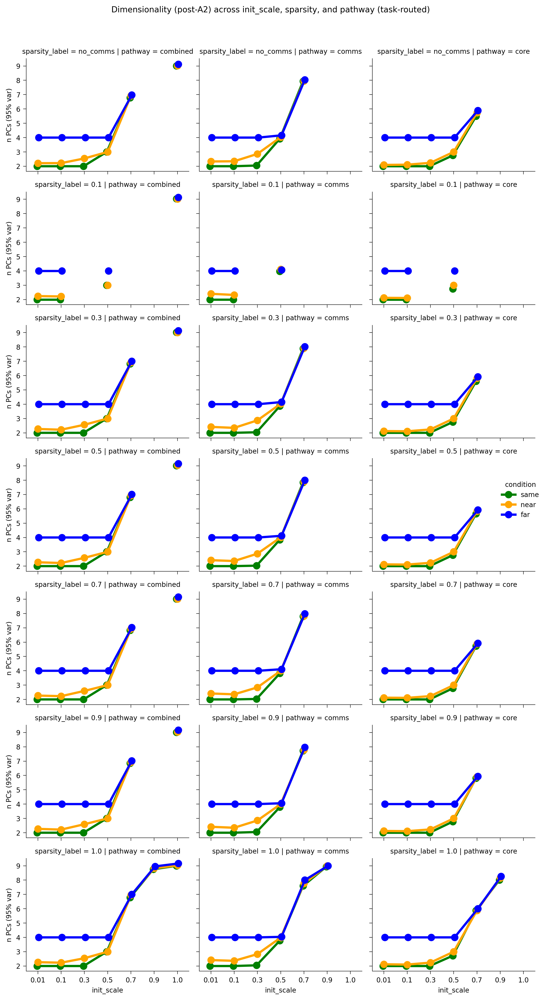

In [8]:
if not rep_df.empty:
    agg_dict = {c: "mean" for c in ["var_topk", "n_pcs_95", "n_pcs_99"] if c in rep_df.columns}
    rep_summary = rep_df.groupby(
        ["run_id", "sparsity_label", "init_scale", "condition", "phase", "pathway"], as_index=False
    ).agg(agg_dict)
    display(rep_summary)

    # n_pcs_95 vs init_scale, by sparsity and pathway
    if "n_pcs_95" in rep_summary.columns:
        sub = rep_summary[rep_summary["phase"] == "post_A2"]
        init_order = INIT_SCALE_ORDER
        sp_order = SPARSITY_ORDER
        g = sns.catplot(
            data=sub,
            x="init_scale",
            y="n_pcs_95",
            hue="condition",
            palette=SIMILARITY_PALETTE,
            col="pathway",
            row="sparsity_label",
            kind="point",
            dodge=True,
            order=init_order,
            hue_order=SIMILARITY_ORDER,
            row_order=sp_order,
            height=2.3,
            aspect=1.2,
        )
        g.set_axis_labels("init_scale", "n PCs (95% var)")
        g.fig.suptitle("Dimensionality (post-A2) across init_scale, sparsity, and pathway (task-routed)", y=1.02)
        plt.tight_layout()
        plt.show()
else:
    rep_summary = pd.DataFrame()
    print("No representation data.")


## 8. PCA geometry (PC1–PC2, combined, post-A2)

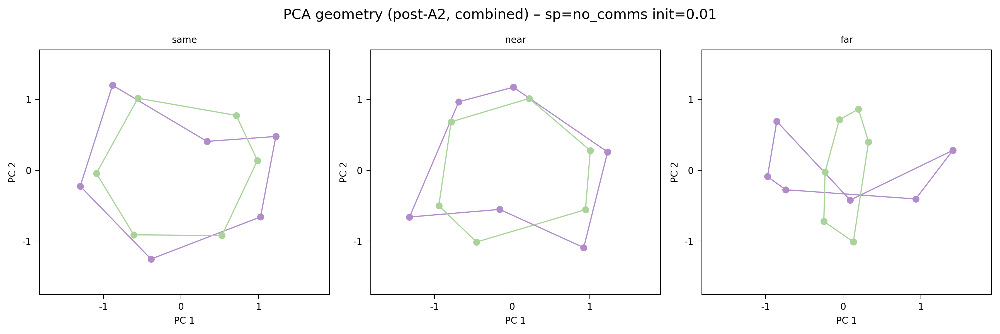

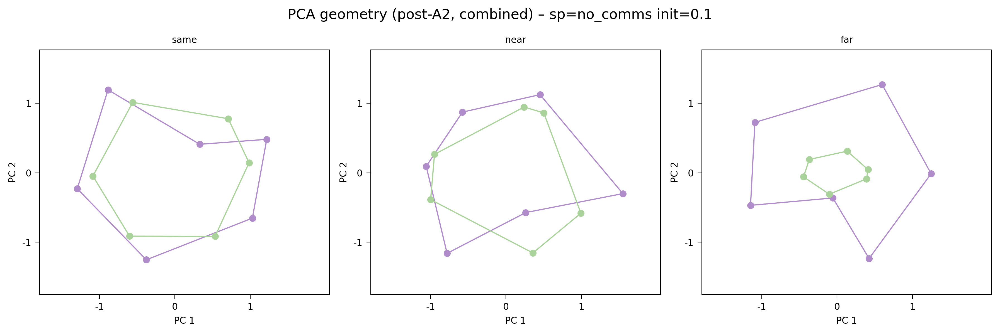

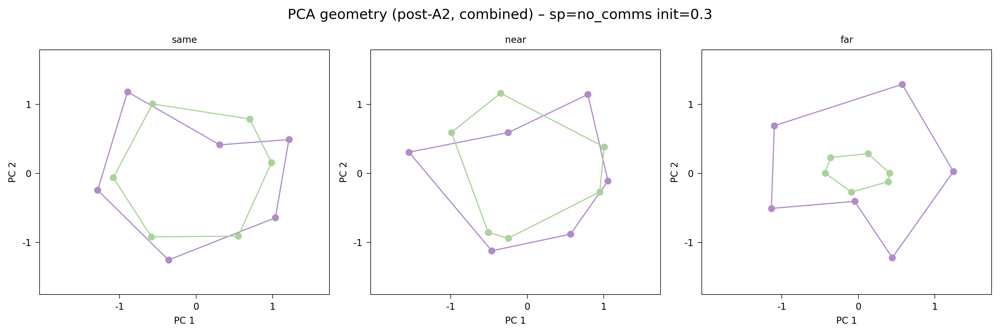

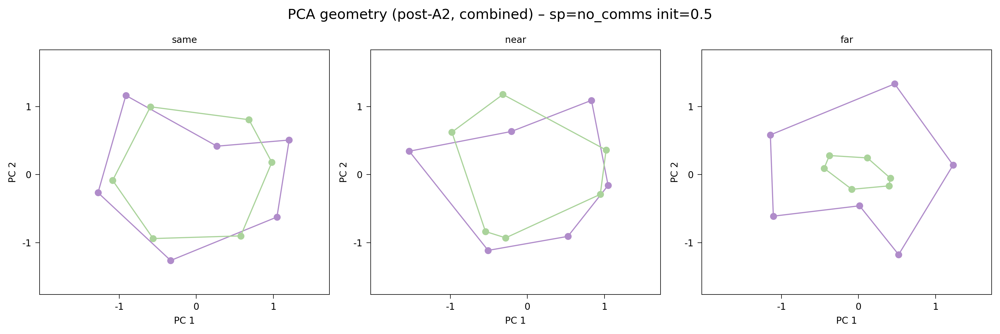

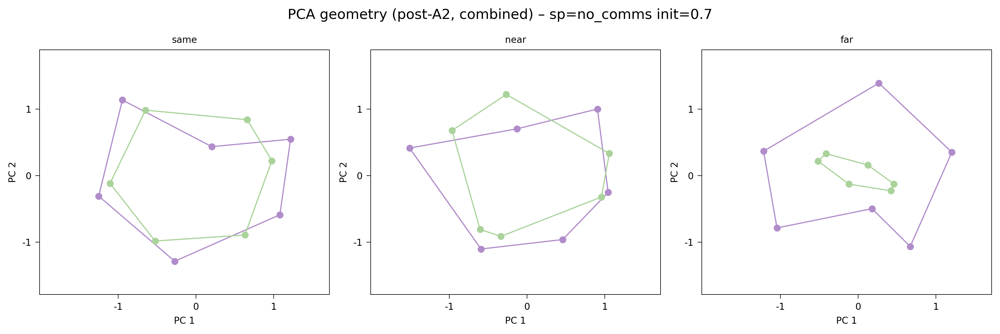

...

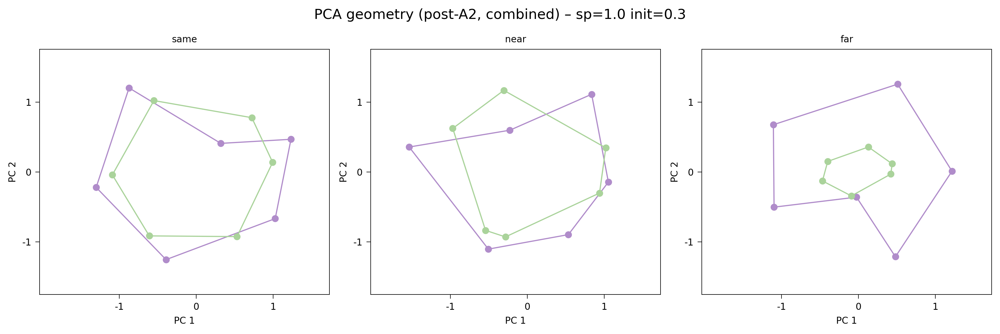

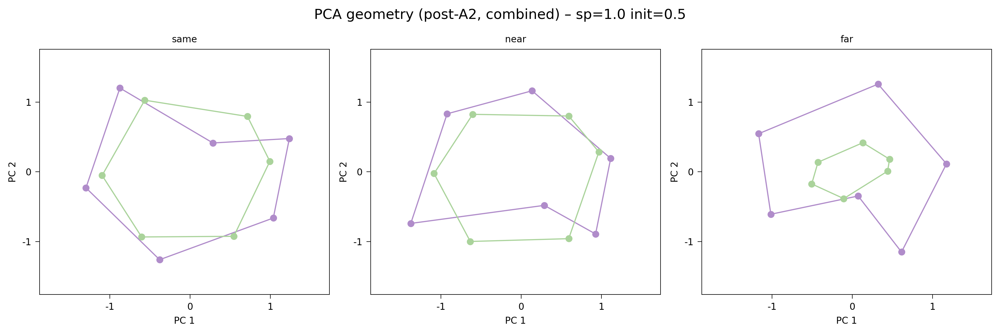

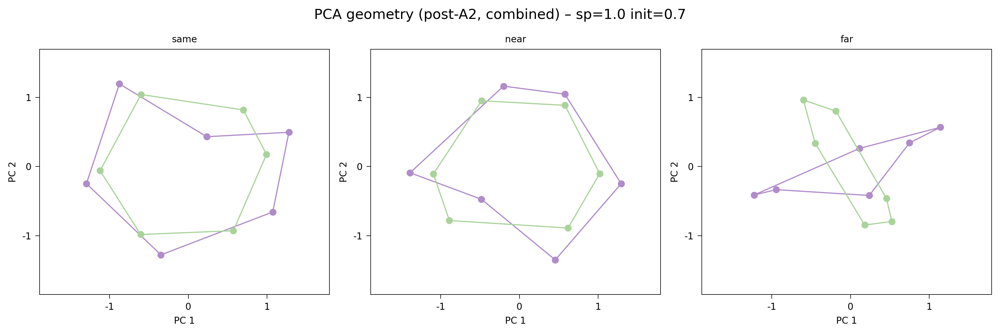

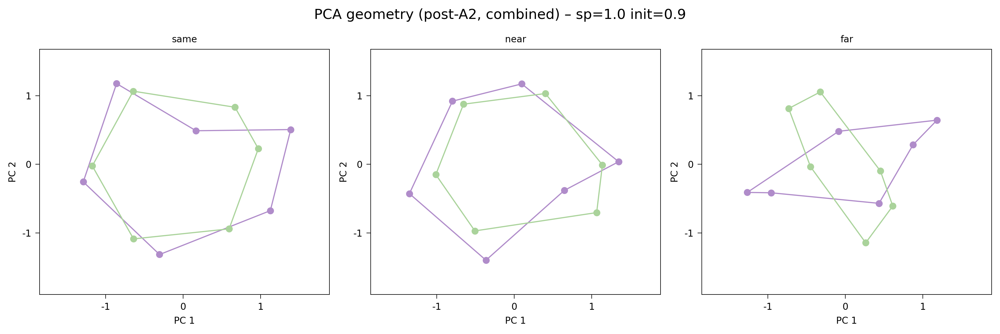

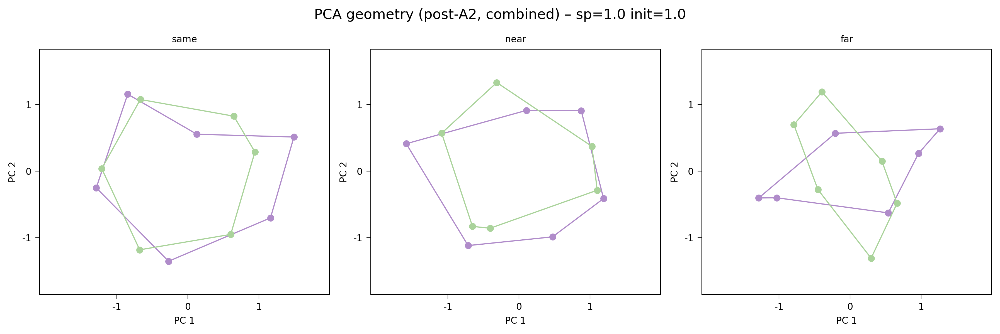

In [9]:
phase_idx = 2
n_stim_plot = 12

for run_id in run_labels:
    bundle = all_ann_data[run_id]
    ann_data = bundle["data"]
    sp_label = bundle["sparsity_label"]
    init_scale = bundle["init_scale"]

    fig, axes = plt.subplots(1, 3, figsize=(12, 4))
    fig.suptitle(f"PCA geometry (post-A2, combined) – sp={sp_label} init={init_scale}", fontsize=12)

    all_2d = []
    for cond in ["same", "near", "far"]:
        entries = ann_data.get(cond, [])
        if not entries:
            all_2d.append(None)
            continue
        entry = entries[0]
        hids = np.asarray(entry.get(f"hiddens_post_phase_{phase_idx}"))
        if hids is None or hids.size == 0 or hids.shape[0] < n_stim_plot:
            all_2d.append(None)
            continue
        hids = hids[:n_stim_plot]
        _, X2 = prepare_pca_single_task(hids)
        all_2d.append(X2)

    valid = [x for x in all_2d if x is not None]
    lims_global = get_axis_limits(np.vstack(valid)) if valid else {}

    for ax, cond, X2 in zip(axes, ["same", "near", "far"], all_2d):
        if X2 is None:
            ax.set_title(f"{cond}\(no data)")
            ax.axis("off")
            continue
        plot_split_stim(ax, X2, task_colours, lims_global)
        ax.set_title(cond)
    plt.tight_layout()
    plt.show()

## 6. Principal angles and transfer vs init_scale

Here we quantify how much task A and task B subspaces separate across initialization scales. We compute principal angles between post-A and post-B representations for each run and similarity condition, and compare them across `init_scale` at fixed sparsity. We also compare transfer and accuracy curves for `init_scale = 1.0, 0.7, 0.5, 0.1` to verify that lower-scale runs are not simply underperforming.

In [ ]:
# 6.1 Principal angles between A and B subspaces across init_scale

angles_records = []

for run_id, bundle in all_ann_data.items():
    ann_data_run = bundle["data"]
    init_scale = bundle["init_scale"]
    sparsity = bundle["sparsity"]
    sp_label = bundle["sparsity_label"]

    # ann.get_principal_angles returns per-participant, per-condition angles
    angles_df = ann.get_principal_angles(ann_data_run)
    angles_df = angles_df.copy()
    angles_df["run_id"] = run_id
    angles_df["init_scale"] = init_scale
    angles_df["sparsity"] = sparsity
    angles_df["sparsity_label"] = sp_label
    angles_records.append(angles_df)

if angles_records:
    angles_all = pd.concat(angles_records, ignore_index=True)
else:
    angles_all = pd.DataFrame(columns=["participant", "condition", "principal_angle_between", "run_id", "init_scale", "sparsity", "sparsity_label"])

print("angles_all:", angles_all.shape)
display(angles_all.head())

SPARSITY_ORDER = ['no_comms', '0.1', '0.3', '0.5', '0.7', '0.9', '1.0', 'single_module']

def get_available_sparsities(series):
    vals = [str(v) for v in pd.Series(series).dropna().astype(str).unique()]
    ordered = [s for s in SPARSITY_ORDER if s in vals]
    extras = sorted([s for s in vals if s not in ordered], key=lambda x: (x == "no_comms", x))
    return ordered + extras

# Aggregate angles by init_scale, sparsity, and condition
if not angles_all.empty:
    angles_agg = (
        angles_all
        .groupby(["init_scale", "sparsity_label", "condition"], as_index=False)["principal_angle_between"]
        .agg(["mean", "sem"])
        .reset_index()
    )
    angles_agg.rename(columns={"mean": "angle_mean", "sem": "angle_sem"}, inplace=True)
    display(angles_agg.head())

    sp_col_order = get_available_sparsities(angles_agg["sparsity_label"])
    sub = angles_agg.copy()
    if not sub.empty:
        g = sns.catplot(
            data=sub,
            x="init_scale",
            y="angle_mean",
            hue="condition",
            palette=SIMILARITY_PALETTE,
            col="sparsity_label",
            col_order=sp_col_order,
            kind="point",
            dodge=True,
            order=INIT_SCALE_ORDER,
            height=3,
            aspect=1.1,
            hue_order=SIMILARITY_ORDER,
            col_wrap=3,
        )
        g.set_axis_labels("init_scale", "Principal angle (deg)")
        g.fig.suptitle(f"Principal angle between A and B vs init_scale ({TARGET_ROUTING})", y=1.02)
        plt.tight_layout()
        plt.show()
else:
    print("No principal angle data.")

# 6.2 Transfer vs init_scale (Holton-style summary)

if not transfer_df.empty:
    transfer_init = (
        transfer_df
        .groupby(["init_scale", "sparsity_label", "condition"], as_index=False)["error_diff"]
        .mean()
    )
    display(transfer_init.head())

    sp_col_order = get_available_sparsities(transfer_init["sparsity_label"])
    sub_tr = transfer_init.copy()
    if not sub_tr.empty:
        g = sns.catplot(
            data=sub_tr,
            x="init_scale",
            y="error_diff",
            hue="condition",
            palette=SIMILARITY_PALETTE,
            col="sparsity_label",
            col_order=sp_col_order,
            kind="point",
            dodge=True,
            order=INIT_SCALE_ORDER,
            height=3,
            aspect=1.1,
            hue_order=SIMILARITY_ORDER,
            col_wrap=3,
        )
        g.set_axis_labels("init_scale", "error_diff (initial B - final A1)")
        g.fig.suptitle(f"Transfer vs init_scale ({TARGET_ROUTING})", y=1.02)
        plt.tight_layout()
        plt.show()
else:
    print("No transfer data.")

# 6.3 Accuracy vs init_scale (post_B and post_A2)

if not accuracy_df.empty:
    acc_phase = accuracy_df[accuracy_df["phase"].isin(["post_B", "post_A2"])].copy()
    acc_init = (
        acc_phase
        .groupby(["init_scale", "sparsity_label", "condition", "phase"], as_index=False)["mean_accuracy"]
        .mean()
    )
    display(acc_init.head())

    for phase in ["post_B", "post_A2"]:
        sub_acc = acc_init[acc_init["phase"] == phase].copy()
        if sub_acc.empty:
            continue
        sp_col_order = get_available_sparsities(sub_acc["sparsity_label"])
        g = sns.catplot(
            data=sub_acc,
            x="init_scale",
            y="mean_accuracy",
            hue="condition",
            palette=SIMILARITY_PALETTE,
            col="sparsity_label",
            col_order=sp_col_order,
            kind="point",
            dodge=True,
            order=INIT_SCALE_ORDER,
            height=3,
            aspect=1.1,
            hue_order=SIMILARITY_ORDER,
            col_wrap=3,
        )
        g.set_axis_labels("init_scale", f"Mean accuracy ({phase})")
        g.fig.suptitle(f"Accuracy vs init_scale ({phase}, {TARGET_ROUTING})", y=1.02)
        plt.tight_layout()
        plt.show()
else:
    print("No accuracy data.")


## 7. Holton-style training trajectories (accuracy and loss)

Here we plot the full training trajectories (A1 → B → A2) of accuracy and loss, in the same spirit as the Holton paper, and compare **init_scale = 1.0, 0.7, 0.5, 0.1** at fixed sparsity and task-routed input. We aggregate over participants for each run and similarity condition (same / near / far).

## 9. Direct comparison: number of PCs across phases

Bar plots of the number of principal components needed to explain 95% and 99% of variance (`n_pcs_95`, `n_pcs_99`) for the **combined** pathway, faceted by `init_scale` and separated by training phase (post_A, post_B, post_A2).


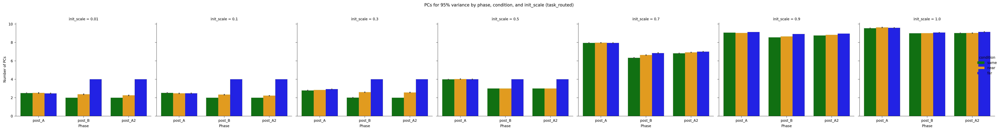

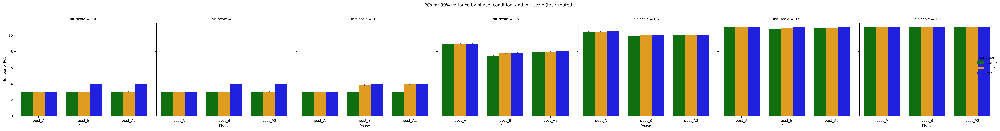

In [11]:
# Matches the subplot construction used in nb_init_scale_geometry_transfer.ipynb (#6a)

phase_order = ["post_A", "post_B", "post_A2"]

if 'rep_summary' in globals() and not rep_summary.empty:
    comp = rep_summary[rep_summary["pathway"] == "combined"].copy()
    comp["phase"] = pd.Categorical(comp["phase"], categories=phase_order, ordered=True)
    comp["init_scale"] = comp["init_scale"].astype(float)
    col_order = INIT_SCALE_ORDER

    for y_col, title in [("n_pcs_95", "PCs for 95% variance"), ("n_pcs_99", "PCs for 99% variance")]:
        if y_col not in comp.columns:
            continue
        g = sns.catplot(
            data=comp,
            x="phase",
            y=y_col,
            hue="condition",
            palette=SIMILARITY_PALETTE,
            col="init_scale",
            col_order=col_order,
            kind="bar",
            dodge=True,
            height=4,
            aspect=1.1,
            order=phase_order,
            hue_order=SIMILARITY_ORDER,
        )
        g.set_axis_labels("Phase", "Number of PCs")
        g.set_titles("init_scale = {col_name}")
        g.fig.suptitle(f"{title} by phase, condition, and init_scale ({TARGET_ROUTING})", y=1.02)
        plt.tight_layout()
        plt.show()
else:
    print("rep_summary not available.")


## 10. Summary

Use these figures and tables to ask:
- How does **init_scale** affect transfer (error_diff) at each sparsity in task-routed networks?
- Do accuracy and loss show the same trends as transfer?
- How does **dimensionality** (n PCs for 95% / 99% variance) change with init_scale and sparsity, for combined/core/comms?
- Does the 2D PCA geometry (PC1–PC2) show qualitatively different clustering or separation across init_scale values?
- How does the **distribution of PC counts** shift across training phases (post_A → post_B → post_A2) for each init_scale and pathway?